In [1]:
!pip install -U ultralytics
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 96.4 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 86.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninst

In [2]:
model = YOLO("yolo11n.pt")


100%|██████████| 5.35M/5.35M [00:00<00:00, 68.7MB/s]


In [3]:
results = model.train(
    data="/kaggle/input/cv-proj2-yolo-v2/CV_proj_yollo.v2i.yolov11/data.yaml",  # your YAML path
    epochs=100,
    imgsz=640,
    batch=16,             # tune based on GPU/TPU RAM
    lr0=0.01,             # you can adjust learning rate
)


Ultralytics 8.3.164 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/cv-proj2-yolo-v2/CV_proj_yollo.v2i.yolov11/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective

RuntimeError: Dataset '/kaggle/input/cv-proj2-yolo-v2/CV_proj_yollo.v2i.yolov11/data.yaml' error ❌ Dataset '/kaggle/input/cv-proj2-yolo-v2/CV_proj_yollo.v2i.yolov11/data.yaml' images not found, missing path '/kaggle/input/cv-proj2-yollo/CV_proj_yollo.v2i.yolov11/valid/images'
Note dataset download directory is '/kaggle/working/datasets'. You can update this in '/root/.config/Ultralytics/settings.json'

In [7]:
import shutil

src = "/kaggle/input/cv-proj2-yolo-v2/CV_proj_yollo.v2i.yolov11"
dst = "/kaggle/working/dataset"

shutil.copytree(src, dst)


'/kaggle/working/dataset'

In [11]:
yaml_content = """
train: /kaggle/working/dataset/train/images
val: /kaggle/working/dataset/valid/images

nc: 2

names:
  0: male
  1: female
"""

with open("/kaggle/working/dataset/data.yaml", "w") as f:
    f.write(yaml_content)


In [12]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(
    data="/kaggle/working/dataset/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16
)


Ultralytics 8.3.164 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pre

100%|██████████| 755k/755k [00:00<00:00, 17.2MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/dataset/train/labels... 1872 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1872/1872 [00:01<00:00, 1456.09it/s]


train: New cache created: /kaggle/working/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 539.9±317.2 MB/s, size: 32.6 KB)


val: Scanning /kaggle/working/dataset/valid/labels... 225 images, 0 backgrounds, 0 corrupt: 100%|██████████| 225/225 [00:00<00:00, 1297.40it/s]

val: New cache created: /kaggle/working/dataset/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.65G      1.733      2.818      1.471         87        640: 100%|██████████| 117/117 [00:22<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.86it/s]

                   all        225        629       0.36      0.402      0.249      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.18G      1.712      2.237      1.419         78        640: 100%|██████████| 117/117 [00:19<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.31it/s]

                   all        225        629      0.324       0.35      0.225      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       3.2G      1.763      2.146      1.456         46        640: 100%|██████████| 117/117 [00:19<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]

                   all        225        629      0.354      0.395      0.282      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.21G      1.717      1.984      1.426         52        640: 100%|██████████| 117/117 [00:19<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.17it/s]

                   all        225        629      0.336       0.38      0.255      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.23G      1.713      1.896      1.427         91        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.27it/s]

                   all        225        629      0.385      0.462      0.309      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.24G      1.667      1.846      1.412         77        640: 100%|██████████| 117/117 [00:20<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]

                   all        225        629      0.446      0.431      0.385      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.26G       1.63      1.782      1.396         52        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.30it/s]

                   all        225        629      0.391      0.321      0.272      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       3.5G      1.629      1.715      1.375         62        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.49it/s]

                   all        225        629      0.437      0.509      0.423      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.51G      1.592      1.668      1.353         64        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.29it/s]

                   all        225        629      0.396      0.484      0.384      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.53G      1.546      1.611      1.341        100        640: 100%|██████████| 117/117 [00:20<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.26it/s]

                   all        225        629      0.497      0.467      0.447      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.54G      1.549      1.593      1.335         82        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.41it/s]

                   all        225        629      0.523      0.432      0.413       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.56G      1.548      1.572       1.32        109        640: 100%|██████████| 117/117 [00:20<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.49it/s]

                   all        225        629       0.48      0.523      0.446       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.57G      1.504      1.515      1.307         50        640: 100%|██████████| 117/117 [00:20<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.58it/s]

                   all        225        629      0.527      0.544      0.501      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.59G      1.505      1.491      1.303         80        640: 100%|██████████| 117/117 [00:20<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.42it/s]

                   all        225        629      0.499      0.511      0.473      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       3.6G      1.495      1.493      1.297        106        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]

                   all        225        629      0.576      0.515      0.487      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.62G      1.485      1.483      1.288         52        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.48it/s]

                   all        225        629      0.569      0.557      0.552      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.63G      1.478      1.398      1.284         65        640: 100%|██████████| 117/117 [00:20<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.61it/s]

                   all        225        629      0.527      0.548      0.534      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.65G      1.455      1.398      1.263         53        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.57it/s]

                   all        225        629      0.535      0.572      0.516      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.66G      1.454      1.368      1.261         93        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.48it/s]

                   all        225        629      0.488      0.503      0.435       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.68G      1.454      1.351      1.266         80        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.44it/s]

                   all        225        629      0.546      0.538      0.541      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.69G      1.419      1.332      1.259         60        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.44it/s]

                   all        225        629       0.61      0.539      0.562      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.71G      1.414      1.322      1.242         73        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.28it/s]

                   all        225        629      0.608      0.559      0.563      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.72G      1.377      1.264      1.236        106        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.59it/s]

                   all        225        629      0.546      0.556      0.549      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.74G       1.39      1.279      1.225         62        640: 100%|██████████| 117/117 [00:20<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.27it/s]

                   all        225        629       0.62      0.556      0.592      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.75G      1.374      1.215      1.213         60        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        225        629      0.638       0.53      0.583      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.77G       1.36       1.22      1.221         81        640: 100%|██████████| 117/117 [00:20<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.42it/s]

                   all        225        629      0.562      0.575      0.564      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.78G      1.363      1.216       1.21         73        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.18it/s]

                   all        225        629      0.602      0.599      0.617      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       3.8G      1.361      1.196      1.207         58        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.61it/s]

                   all        225        629      0.635      0.603      0.609      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.81G       1.36      1.202      1.209         49        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.54it/s]

                   all        225        629      0.727       0.56       0.65      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.82G      1.315      1.154      1.187        130        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.47it/s]

                   all        225        629      0.666      0.574       0.64      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.84G      1.324      1.139      1.191        102        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.57it/s]

                   all        225        629       0.62      0.628       0.64      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.86G      1.332       1.14      1.191         55        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.56it/s]

                   all        225        629      0.662      0.602      0.648      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.87G      1.305      1.125       1.18         55        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.46it/s]

                   all        225        629      0.673      0.564      0.625      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.88G      1.296      1.115      1.178         72        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]

                   all        225        629      0.656      0.567      0.616      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       3.9G      1.283      1.096      1.176         67        640: 100%|██████████| 117/117 [00:20<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.32it/s]

                   all        225        629      0.639      0.592      0.627      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.91G      1.266      1.056      1.158         53        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.37it/s]

                   all        225        629      0.683      0.595      0.641      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.93G      1.275      1.042      1.163         85        640: 100%|██████████| 117/117 [00:20<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]

                   all        225        629      0.715      0.587      0.649      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.94G      1.259      1.036      1.152         72        640: 100%|██████████| 117/117 [00:20<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.57it/s]

                   all        225        629      0.631      0.592      0.598      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.96G       1.25       1.02      1.143         66        640: 100%|██████████| 117/117 [00:20<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]

                   all        225        629      0.724      0.588      0.671       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.97G      1.266      1.033      1.152         74        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.35it/s]

                   all        225        629      0.741      0.618      0.692       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.99G      1.219      0.986      1.136         52        640: 100%|██████████| 117/117 [00:20<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.65it/s]

                   all        225        629      0.765      0.554      0.659      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         4G      1.248      1.005      1.147         60        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.56it/s]

                   all        225        629      0.673      0.595      0.654      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.02G      1.231     0.9942      1.136         57        640: 100%|██████████| 117/117 [00:20<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.63it/s]

                   all        225        629      0.787      0.555      0.664       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.03G      1.212     0.9799      1.133         63        640: 100%|██████████| 117/117 [00:20<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.23it/s]

                   all        225        629      0.719      0.598      0.656      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.05G      1.218     0.9547      1.126        126        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.32it/s]

                   all        225        629      0.665      0.632      0.666      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.06G      1.219     0.9464      1.126         90        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]

                   all        225        629      0.769      0.602      0.706      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.08G      1.188     0.9335      1.124         76        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]

                   all        225        629      0.789      0.588      0.682      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.09G      1.199     0.9372      1.123         71        640: 100%|██████████| 117/117 [00:20<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.50it/s]

                   all        225        629      0.751      0.622      0.682      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.11G      1.201     0.9324      1.118         50        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]

                   all        225        629      0.723      0.656      0.704      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.12G      1.201     0.9217      1.109         79        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.54it/s]

                   all        225        629      0.773      0.646      0.716      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.39G       1.18     0.9057      1.104         69        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.44it/s]

                   all        225        629      0.711      0.622      0.688      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       4.4G      1.171     0.8785      1.106        132        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.67it/s]

                   all        225        629      0.763      0.623      0.696      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.42G      1.149      0.868      1.101         89        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]

                   all        225        629      0.757      0.652      0.713      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.43G      1.161     0.8843      1.099         80        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]

                   all        225        629      0.754      0.671      0.736      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.45G      1.144     0.8433      1.086        150        640: 100%|██████████| 117/117 [00:20<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]

                   all        225        629      0.761      0.633      0.691      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.46G      1.171     0.8698      1.096         89        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]

                   all        225        629      0.759      0.641      0.704      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.48G      1.138     0.8529      1.085         34        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.54it/s]

                   all        225        629      0.688      0.644      0.688      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.49G      1.113     0.8277      1.077         44        640: 100%|██████████| 117/117 [00:20<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.43it/s]

                   all        225        629      0.753      0.646      0.709      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.51G      1.127      0.826      1.083         57        640: 100%|██████████| 117/117 [00:20<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.56it/s]

                   all        225        629      0.787      0.637      0.717      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.52G      1.116     0.8128      1.078         68        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.50it/s]

                   all        225        629      0.804      0.661      0.745      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.54G      1.115     0.7991      1.078         76        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.40it/s]

                   all        225        629      0.809       0.64      0.721      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.55G       1.11     0.8005      1.076         56        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.48it/s]

                   all        225        629      0.795      0.627      0.713      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.57G      1.107      0.786      1.069         75        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.55it/s]

                   all        225        629      0.793      0.655      0.738      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.58G      1.078     0.7747      1.065        117        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.56it/s]

                   all        225        629      0.744      0.658      0.717       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100       4.6G      1.096     0.7865      1.062         49        640: 100%|██████████| 117/117 [00:20<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]

                   all        225        629      0.748       0.67      0.729      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.61G      1.095     0.7728      1.067        105        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.45it/s]

                   all        225        629      0.788      0.662      0.737      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.63G       1.07     0.7658      1.063         44        640: 100%|██████████| 117/117 [00:20<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.67it/s]

                   all        225        629      0.848      0.634      0.755      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.64G      1.068     0.7593      1.055         58        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.68it/s]

                   all        225        629      0.788      0.669      0.748      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.65G      1.064      0.745      1.052         58        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]

                   all        225        629      0.777      0.678      0.741      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.67G       1.06      0.739      1.054         63        640: 100%|██████████| 117/117 [00:20<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.27it/s]

                   all        225        629      0.808       0.65      0.744      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.69G      1.049     0.7285      1.045        116        640: 100%|██████████| 117/117 [00:20<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.54it/s]

                   all        225        629      0.756      0.693      0.749       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       4.7G      1.045     0.7381      1.051         44        640: 100%|██████████| 117/117 [00:20<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.47it/s]

                   all        225        629      0.797      0.672      0.749      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.71G      1.043     0.7256      1.048         65        640: 100%|██████████| 117/117 [00:20<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.44it/s]

                   all        225        629      0.832      0.646       0.74      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.73G      1.031     0.7143      1.037         98        640: 100%|██████████| 117/117 [00:20<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.56it/s]

                   all        225        629      0.791      0.665       0.75      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.74G      1.045     0.7214      1.041        104        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.44it/s]

                   all        225        629      0.831      0.662      0.755      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.76G      1.016     0.6969      1.033         62        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.72it/s]

                   all        225        629      0.806      0.684      0.758      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.77G      1.032     0.7051      1.037         75        640: 100%|██████████| 117/117 [00:20<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.55it/s]

                   all        225        629      0.779       0.67      0.732      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.79G      1.027     0.7014      1.033         88        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]

                   all        225        629      0.828      0.691      0.764      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       4.8G      1.005     0.6891      1.028         63        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.58it/s]

                   all        225        629      0.795       0.68      0.747      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.82G     0.9949     0.6763      1.024         44        640: 100%|██████████| 117/117 [00:20<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.37it/s]

                   all        225        629      0.823       0.67      0.753      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.83G      1.003     0.6726      1.025         64        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.47it/s]

                   all        225        629      0.829      0.695      0.769      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.85G     0.9961     0.6737      1.022         77        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.63it/s]

                   all        225        629      0.825      0.674      0.758      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.86G     0.9894     0.6655      1.008         52        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.50it/s]

                   all        225        629      0.834      0.668      0.766      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.88G     0.9922     0.6609      1.017         95        640: 100%|██████████| 117/117 [00:20<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.49it/s]

                   all        225        629      0.859      0.689      0.778      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.89G     0.9785     0.6575      1.015         79        640: 100%|██████████| 117/117 [00:20<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.41it/s]

                   all        225        629       0.85      0.663      0.769      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.91G     0.9738     0.6454       1.01         62        640: 100%|██████████| 117/117 [00:20<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.59it/s]

                   all        225        629      0.839      0.685      0.769      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.92G     0.9798     0.6506      1.006         57        640: 100%|██████████| 117/117 [00:20<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.59it/s]

                   all        225        629      0.809      0.698      0.761      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.94G      0.962      0.638      1.006        113        640: 100%|██████████| 117/117 [00:20<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.12it/s]

                   all        225        629      0.832      0.682      0.769      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.95G     0.9515     0.6393      0.998         88        640: 100%|██████████| 117/117 [00:20<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.63it/s]

                   all        225        629       0.85      0.667      0.762      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.97G     0.9669     0.6383     0.9976         94        640: 100%|██████████| 117/117 [00:20<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]

                   all        225        629      0.821      0.686      0.764       0.51


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.98G     0.9185     0.5655     0.9774         50        640: 100%|██████████| 117/117 [00:20<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.36it/s]

                   all        225        629       0.83       0.67      0.751        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         5G     0.8913     0.5341     0.9689         37        640: 100%|██████████| 117/117 [00:19<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.67it/s]

                   all        225        629      0.826      0.687      0.763      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.01G     0.8774     0.5251     0.9596         61        640: 100%|██████████| 117/117 [00:20<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.66it/s]

                   all        225        629      0.845      0.665       0.76      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.03G     0.8799     0.5227     0.9607         35        640: 100%|██████████| 117/117 [00:20<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.61it/s]

                   all        225        629      0.841      0.678      0.765      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.04G     0.8607     0.5134     0.9486        154        640: 100%|██████████| 117/117 [00:19<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.62it/s]

                   all        225        629      0.867      0.656       0.77      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.06G     0.8622     0.5074      0.953         73        640: 100%|██████████| 117/117 [00:19<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.54it/s]

                   all        225        629      0.872       0.66      0.766      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.07G     0.8569     0.5076     0.9521         72        640: 100%|██████████| 117/117 [00:19<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.49it/s]

                   all        225        629      0.853      0.668      0.763      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.09G     0.8534      0.505     0.9459         37        640: 100%|██████████| 117/117 [00:19<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]

                   all        225        629       0.85      0.677      0.768      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       5.1G     0.8416      0.497     0.9445         38        640: 100%|██████████| 117/117 [00:20<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.46it/s]

                   all        225        629      0.859      0.674      0.766      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.12G     0.8383     0.4908       0.94         30        640: 100%|██████████| 117/117 [00:20<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.66it/s]

                   all        225        629      0.871      0.662      0.765      0.518



100 epochs completed in 0.612 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.164 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.08it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        225        629      0.857      0.689      0.778      0.518
                  male        141        272      0.856      0.717        0.8      0.548
                female        152        357      0.858      0.661      0.755      0.487
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train2


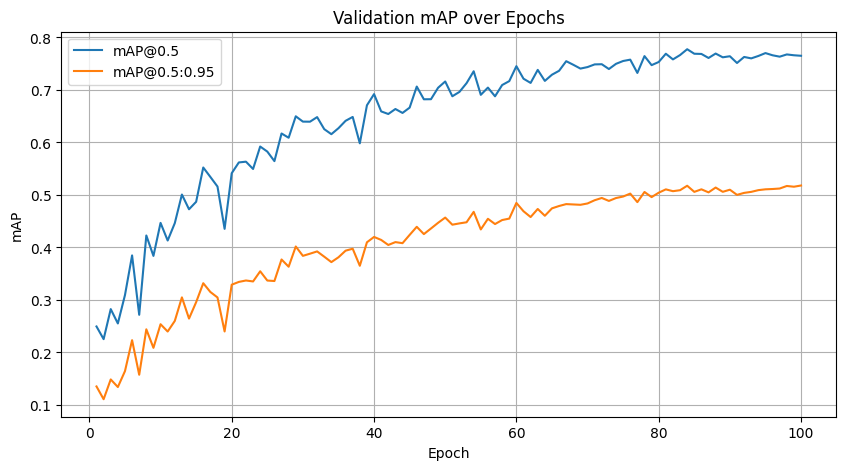

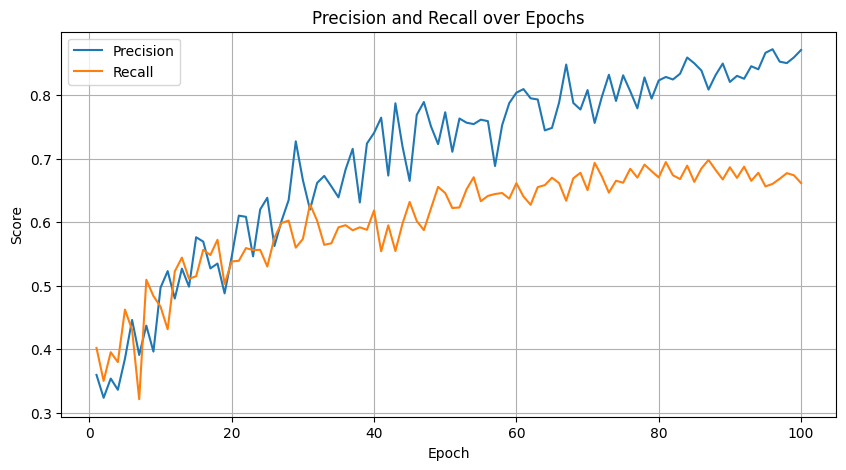

In [15]:
import matplotlib.pyplot as plt

# mAP@0.5 and mAP@0.5:0.95
plt.figure(figsize=(10, 5))
plt.plot(df["epoch"], df["metrics/mAP50(B)"], label="mAP@0.5")
plt.plot(df["epoch"], df["metrics/mAP50-95(B)"], label="mAP@0.5:0.95")
plt.xlabel("Epoch")
plt.ylabel("mAP")
plt.title("Validation mAP over Epochs")
plt.legend()
plt.grid(True)
plt.show()

# Precision & Recall
plt.figure(figsize=(10, 5))
plt.plot(df["epoch"], df["metrics/precision(B)"], label="Precision")
plt.plot(df["epoch"], df["metrics/recall(B)"], label="Recall")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Precision and Recall over Epochs")
plt.legend()
plt.grid(True)
plt.show()


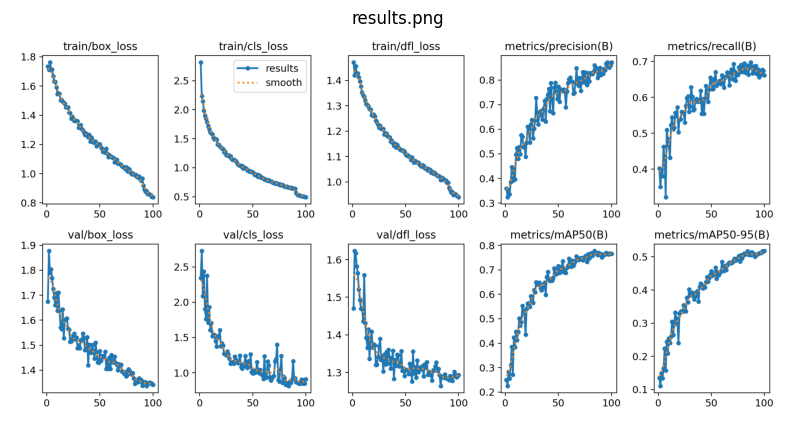

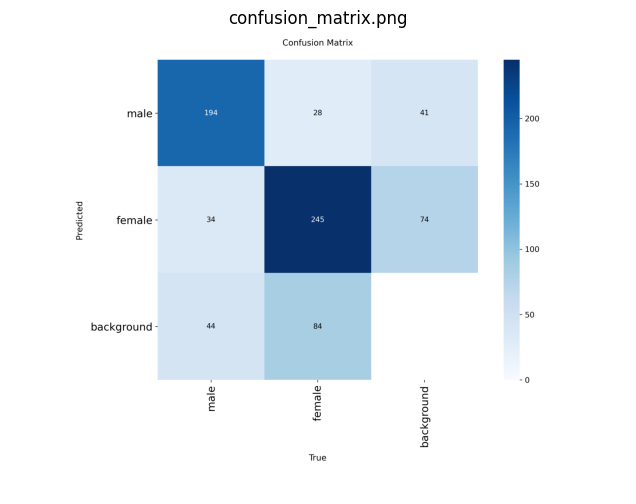

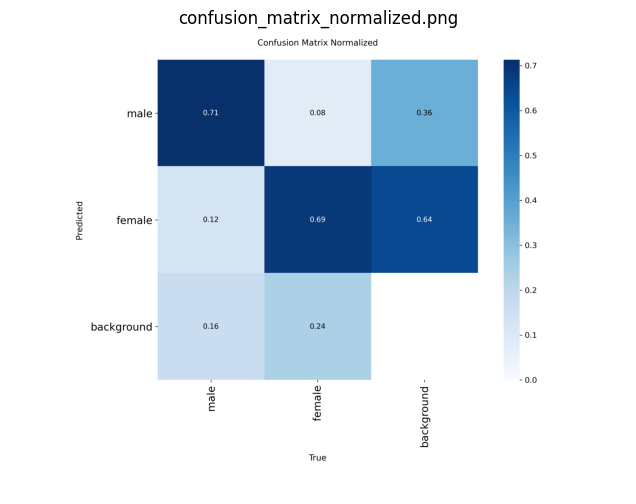

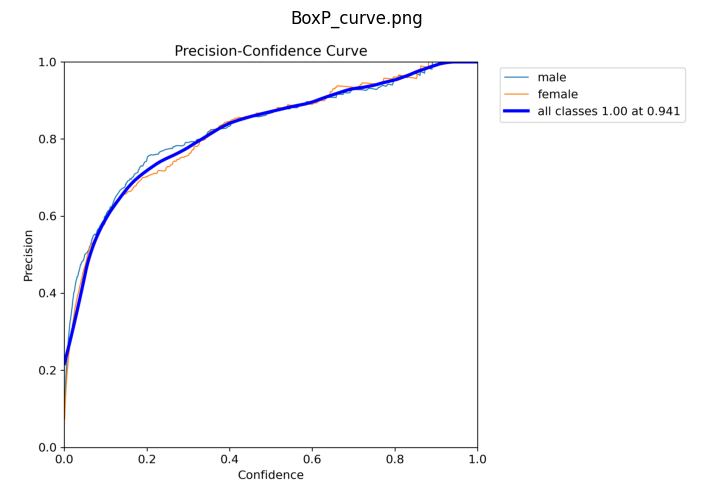

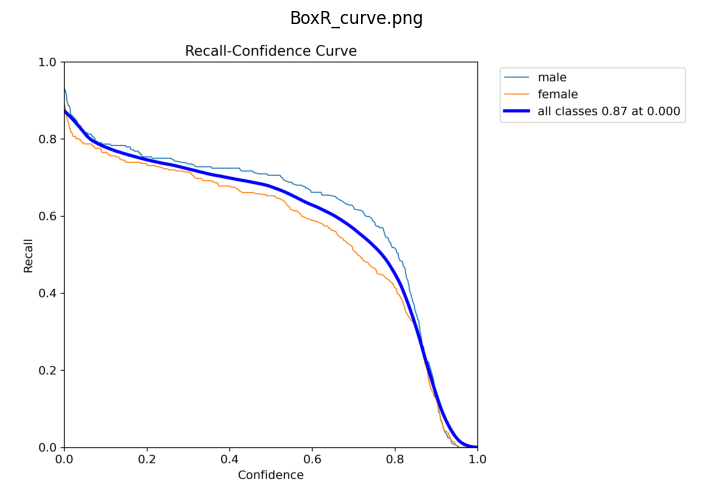

...

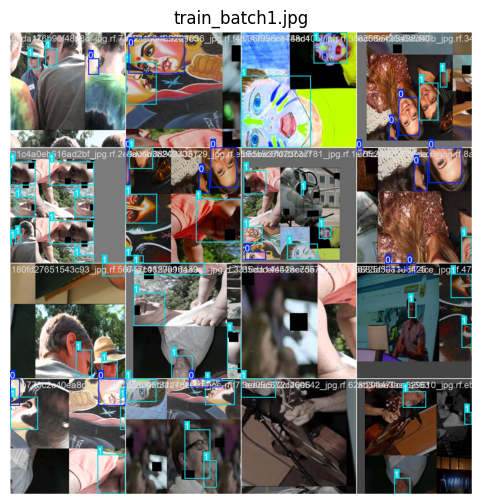

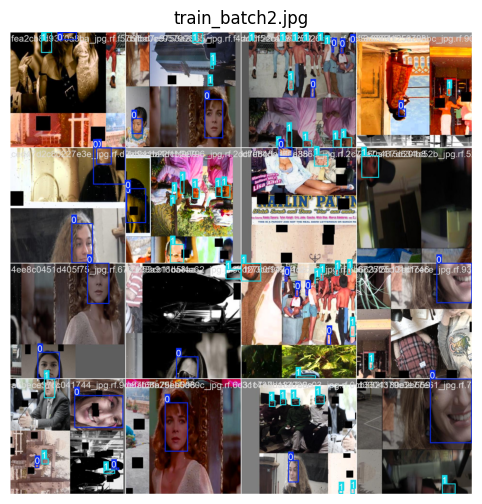

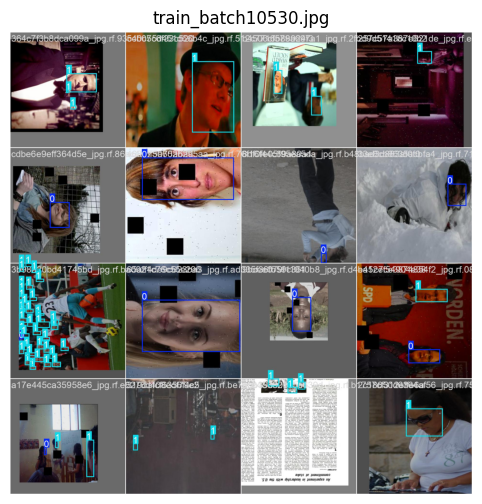

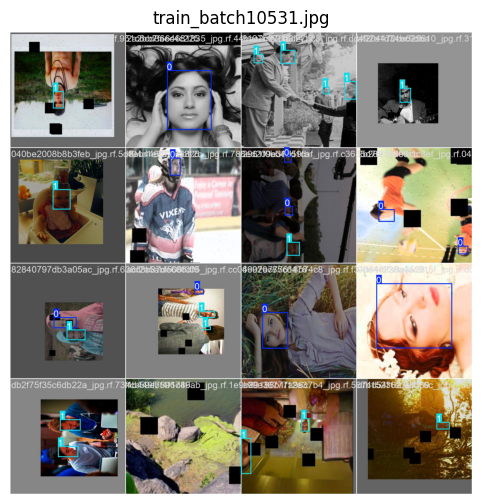

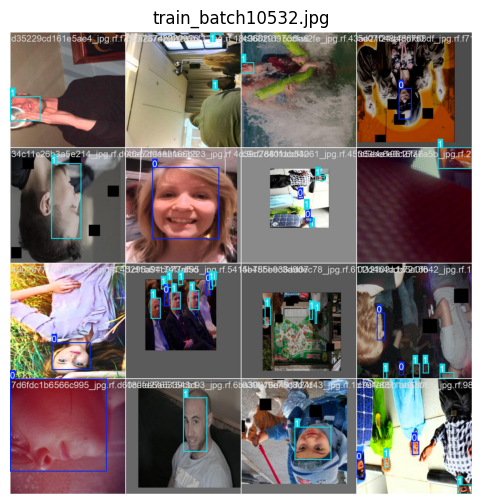

In [71]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Base path
folder = "/kaggle/working/runs/detect/train2"

# Files to display (can be expanded)
images_to_show = [
    "results.png",
    "confusion_matrix.png",
    "confusion_matrix_normalized.png",
    "BoxP_curve.png",
    "BoxR_curve.png",
    "BoxPR_curve.png",
    "BoxF1_curve.png",
    "labels.jpg",
    "labels_correlogram.jpg",
    "val_batch0_pred.jpg",
    "val_batch1_pred.jpg",
    "val_batch2_pred.jpg",
    "val_batch0_labels.jpg",
    "val_batch1_labels.jpg",
    "val_batch2_labels.jpg",
    "train_batch0.jpg",
    "train_batch1.jpg",
    "train_batch2.jpg",
    "train_batch10530.jpg",
    "train_batch10531.jpg",
    "train_batch10532.jpg"
]

# Display images
for img_name in images_to_show:
    img_path = os.path.join(folder, img_name)
    if os.path.exists(img_path):
        img = Image.open(img_path)
        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.axis("off")
        plt.title(img_name)
        plt.show()
    else:
        print(f"❌ Not found: {img_name}")


In [46]:
import os
import cv2
from ultralytics import YOLO
from glob import glob

# 1. Load your trained model
model = YOLO("runs/detect/train2/weights/best.pt")  # or full path to best.pt

# 2. Define input and output paths
input_dir = "/kaggle/input/cv-proj2-yolo-v2-test/Pridect"
output_dir = "/kaggle/working/cropped"
os.makedirs(output_dir, exist_ok=True)

# 3. Run inference
image_paths = glob(f"{input_dir}/*.jpg") + glob(f"{input_dir}/*.png") + glob(f"{input_dir}/*.jpeg")


In [47]:
for img_path in image_paths:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = model.predict(img_rgb, conf=0.5, verbose=False)

    for i, r in enumerate(results):
        if r.boxes is None or len(r.boxes) == 0:
            continue
        for j, box in enumerate(r.boxes):
            xyxy = box.xyxy[0].cpu().numpy().astype(int)
            cls = int(box.cls[0])
            class_name = model.names[cls]

            x1, y1, x2, y2 = xyxy
            cropped = img[y1:y2, x1:x2]

            # Save cropped face
            base = os.path.basename(img_path).split('.')[0]
            save_path = os.path.join(output_dir, f"{base}_{class_name}_{j}.jpg")
            cv2.imwrite(save_path, cropped)

In [60]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights
from PIL import Image, ImageOps, ImageDraw, ImageFont
import os
import glob
import pandas as pd
import random
import matplotlib.pyplot as plt

# ---------------- Config ---------------- #
MODEL_PATH = "/kaggle/input/classifier/pytorch/default/1/celebrity_classifier.pth"
CROPPED_DIR = "/kaggle/working/cropped"
OUTPUT_CSV = "/kaggle/working/cropped_predictions.csv"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = 16

# ---------------- Class Names ---------------- #
FACE_CLASSES = {
    0: 'Iqra Aziz', 1: 'Hamuyun Saeed', 2: 'Qubra Khan', 3: 'Maira Khan', 4: 'Naseem Shah', 5: 'Noman Ijaz',
    6: 'Neelam Muneer', 7: 'Ramsha Khan', 8: 'Sajal Ali', 9: 'Shaheen Shah Afridi', 10: 'Atif Aslam', 11: 'Fahad Mustafa',
    12: 'Fawad Khan', 13: 'Hamza Ali Abbasi', 14: 'Hania Amir', 15: 'Unknown'
}


# -------- Pad + Resize Helper -------- #
def pad_resize(img, target_size=(224, 224)):
    old_size = img.size  # (W, H)
    desired_size = max(old_size)
    delta_w = desired_size - old_size[0]
    delta_h = desired_size - old_size[1]
    padding = (delta_w // 2, delta_h // 2, delta_w - delta_w // 2, delta_h - delta_h // 2)
    padded_img = ImageOps.expand(img, padding, fill=(0, 0, 0))
    return padded_img.resize(target_size)

# -------- Transforms -------- #
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

# -------- Load Model -------- #
model = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)
in_f = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(in_f, 512),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(512, NUM_CLASSES)
)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# -------- Inference -------- #
image_paths = glob.glob(f"{CROPPED_DIR}/*.jpg")
results = []

for path in image_paths:
    img = Image.open(path).convert("RGB")
    img_resized = pad_resize(img)
    input_tensor = transform(img_resized).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax(dim=1).item()
        class_name = FACE_CLASSES.get(pred_class, "Unknown")

    results.append((os.path.basename(path), pred_class, class_name))

# -------- Save to CSV -------- #
df = pd.DataFrame(results, columns=["filename", "predicted_class", "class_name"])
df.to_csv(OUTPUT_CSV, index=False)



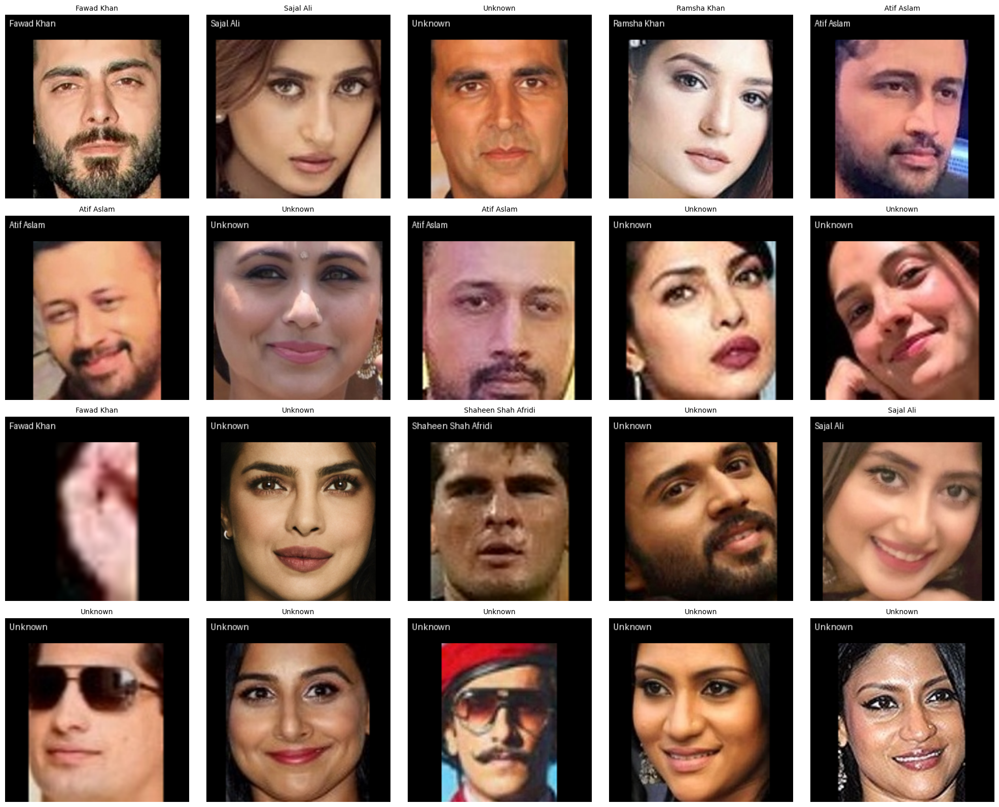

In [68]:
import matplotlib.pyplot as plt
import random
from PIL import Image, ImageDraw

# -------- Show 20 Random Sample Predictions -------- #
sample_images = random.sample(image_paths, min(20, len(image_paths)))  # Up to 20
plt.figure(figsize=(20, 16))  # Wider figure

for i, path in enumerate(sample_images):
    img = Image.open(path).convert("RGB")
    img_resized = pad_resize(img)

    input_tensor = transform(img_resized).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax(dim=1).item()
        class_name = FACE_CLASSES.get(pred_class, "Unknown")

    # Draw label
    draw = ImageDraw.Draw(img_resized)
    draw.rectangle([0, 0, 223, 30], fill=(0, 0, 0, 127))
    draw.text((5, 5), class_name, fill="white")

    # Plot (5 columns, 4 rows)
    plt.subplot(4, 5, i + 1)
    plt.imshow(img_resized)
    plt.axis("off")
    plt.title(class_name, fontsize=10)

plt.tight_layout()
plt.show()


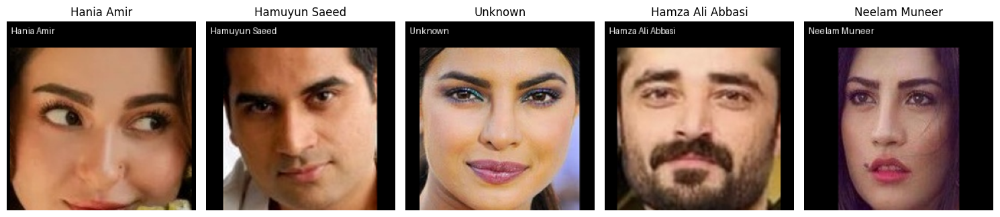

In [69]:
# -------- Show Random Sample Predictions -------- #
sample_images = random.sample(image_paths, min(5, len(image_paths)))
plt.figure(figsize=(15, 8))

for i, path in enumerate(sample_images):
    img = Image.open(path).convert("RGB")
    img_resized = pad_resize(img)

    input_tensor = transform(img_resized).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax(dim=1).item()
        class_name = FACE_CLASSES.get(pred_class, "Unknown")

    # Draw label on image
    draw = ImageDraw.Draw(img_resized)
    draw.rectangle([0, 0, 223, 30], fill=(0, 0, 0, 127))
    draw.text((5, 5), class_name, fill="white")

    # Plot
    plt.subplot(1, 5, i+1)
    plt.imshow(img_resized)
    plt.axis("off")
    plt.title(class_name)

plt.tight_layout()
plt.show()
